In [1]:
import conex as CNX
import cv2
from matplotlib import pyplot as plt
import torch

In [2]:
from filters import DoGFilter, GaborFilter
from convolution import convolve, batch_convolve, convolve3d
from encoding import encode_and_plot

In [3]:
def apply_filters(
    image_name="",
    sigma_1=10 / 15,
    sigma_2=3 / 15,
    one_sum=True,
    zero_mean=True,
    normalize_filters=False,
    useTorch=False,
    ):
    DoG_filters_result = DoGFilter(sigma_1=sigma_1,
                                   sigma_2=sigma_2,
                                   one_sum=one_sum,
                                   zero_mean=zero_mean,
                                   normalize_filters=normalize_filters)
    
    f3, f7, f11 = DoG_filters_result["filters"]
    parameters = []
    for d in DoG_filters_result["parameters"]:
        for item in d:
            parameters.append(f"{item}: {d[item]}")

    results = (
        batch_convolve(
                image_name,
                useTorch=useTorch,
                # parameters=parameters,
                prefix="./pictures/",
                n=100,
                show_image=True,
                filters=[f3, f7, f11],
                flatten=True,
                title="DoG_filter",
            ),
    )
    encode_and_plot(results[0], method="ITL")
    encode_and_plot(results[0], method="init_poisson")

/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f3 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:25: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f7 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f11 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/Plot_convolution.py:104: UserWarning: The figure layout has

['f3_sigma_1: 2.0', 'f3_ssigma_2: 0.6000000000000001', 'f7_sigma_1: 4.666666666666666', 'f7_sigma_2: 1.4000000000000001', 'f11_sigma_1: 7.333333333333333', 'f11_sigma_2: 2.2']


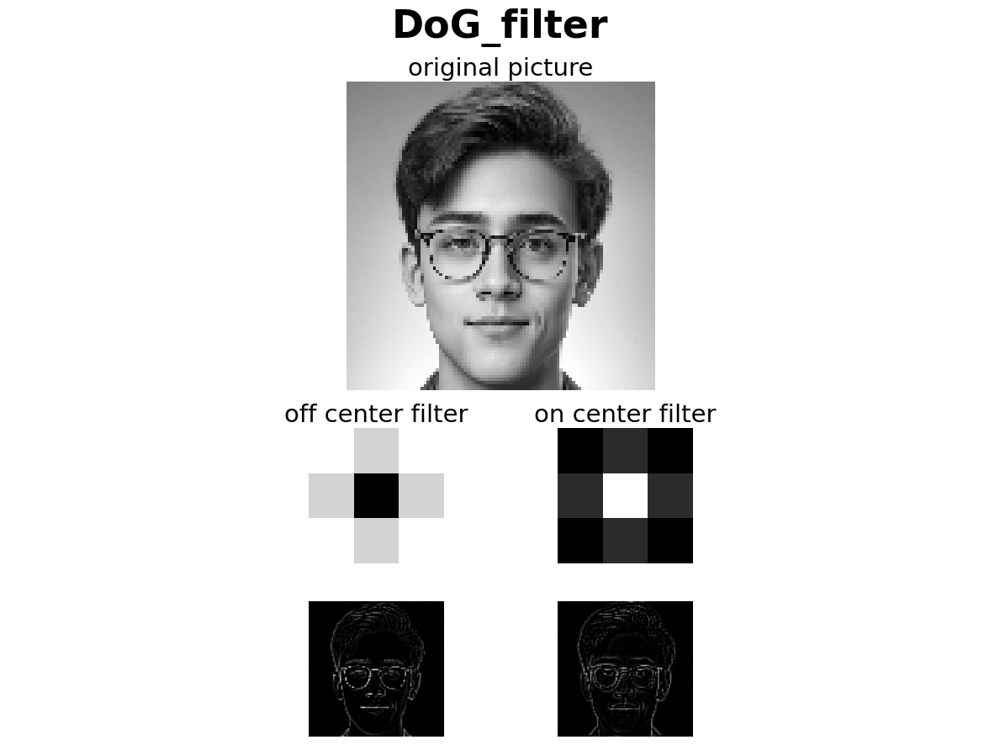

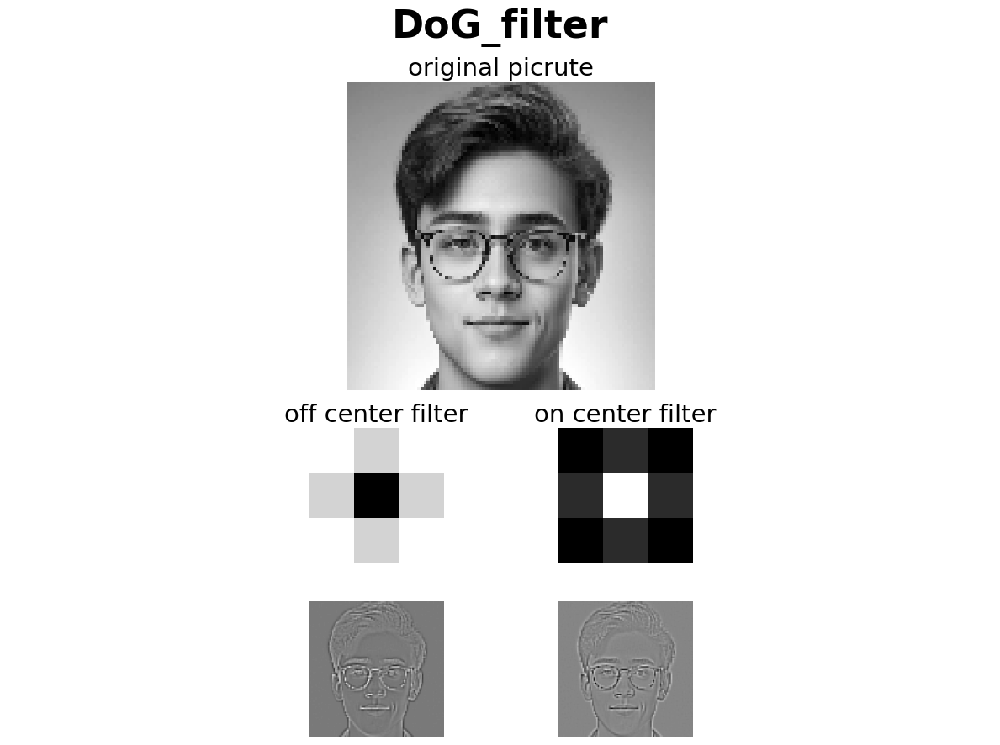

In [4]:
DoG_filters_result = DoGFilter()
f3, f7, f11 = DoG_filters_result["filters"]
parameters = []
for d in DoG_filters_result["parameters"]:
    for item in d:
        parameters.append(f"{item}: {d[item]}")
print(parameters)

results = (
    convolve(
        "Sample4.jpeg",
        # parameters=parameters,
        prefix="./pictures/",
        n=100,
        show_image=True,
        filter=f3,
        flatten=True,
        title="DoG_filter",
    ),
)
results = (
    convolve(
        "Sample4.jpeg",
        # parameters=parameters,
        useTorch=True,
        prefix="./pictures/",
        n=100,
        show_image=True,
        filter=f3,
        flatten=True,
        title="DoG_filter",
    ),
)

50xBatch: 1/1 (100%) 14.295ms
50xBatch: 1/1 (100%) 13.004ms
50xBatch: 1/1 (100%) 14.720ms
50xBatch: 1/1 (100%) 9.811ms
50xBatch: 1/1 (100%) 20.873ms
50xBatch: 1/1 (100%) 20.797ms
50xBatch: 1/1 (100%) 15.714ms
50xBatch: 1/1 (100%) 21.892ms
50xBatch: 1/1 (100%) 18.730ms
50xBatch: 1/1 (100%) 12.466ms
50xBatch: 1/1 (100%) 15.388ms
50xBatch: 1/1 (100%) 14.191ms


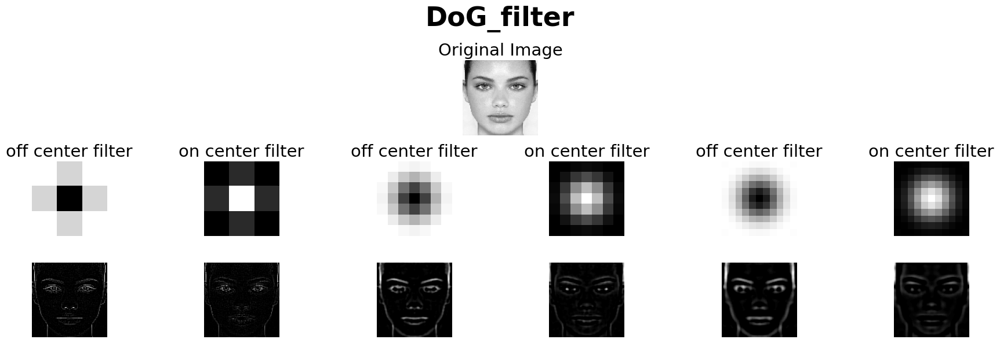

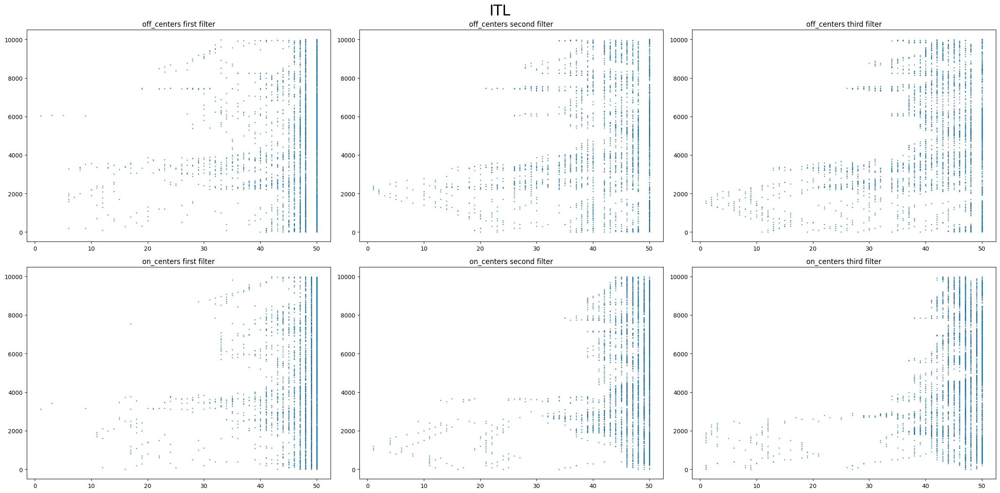

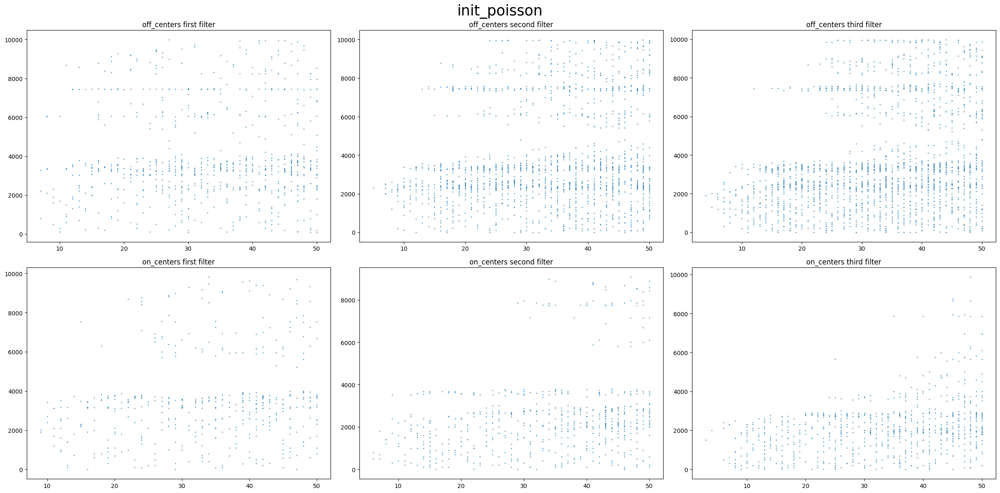

In [129]:
apply_filters(
    image_name="Sample1.jpeg",
    sigma_1=0.66,
    sigma_2=0.2,
    useTorch=False
    )

/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f3 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:25: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f7 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f11 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/convolution.py:474: UserWarning: To copy construct from a t

50xBatch: 1/1 (100%) 14.393ms
50xBatch: 1/1 (100%) 21.895ms
50xBatch: 1/1 (100%) 14.100ms
50xBatch: 1/1 (100%) 10.085ms
50xBatch: 1/1 (100%) 13.957ms
50xBatch: 1/1 (100%) 10.178ms


/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/encoding.py:114: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/encoding.py:115: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


50xBatch: 1/1 (100%) 14.209ms
50xBatch: 1/1 (100%) 13.564ms
50xBatch: 1/1 (100%) 14.983ms
50xBatch: 1/1 (100%) 10.153ms
50xBatch: 1/1 (100%) 9.595ms
50xBatch: 1/1 (100%) 10.903ms


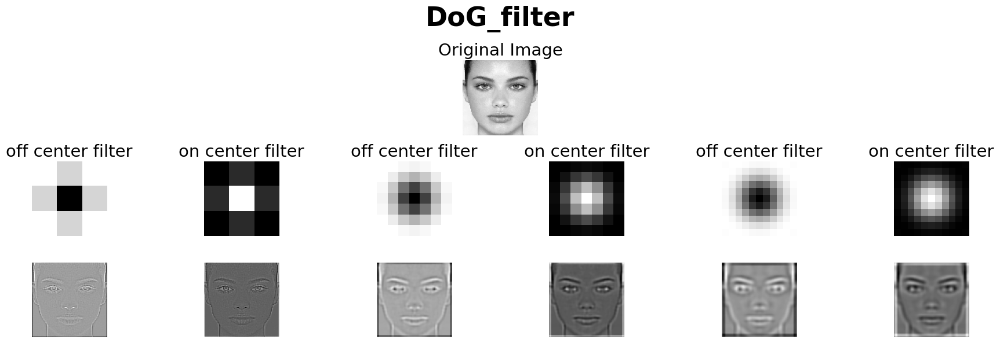

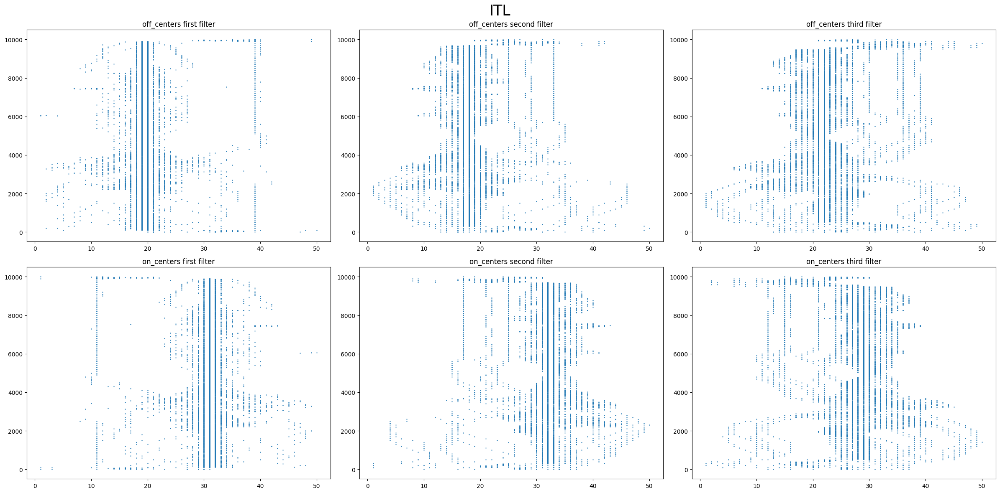

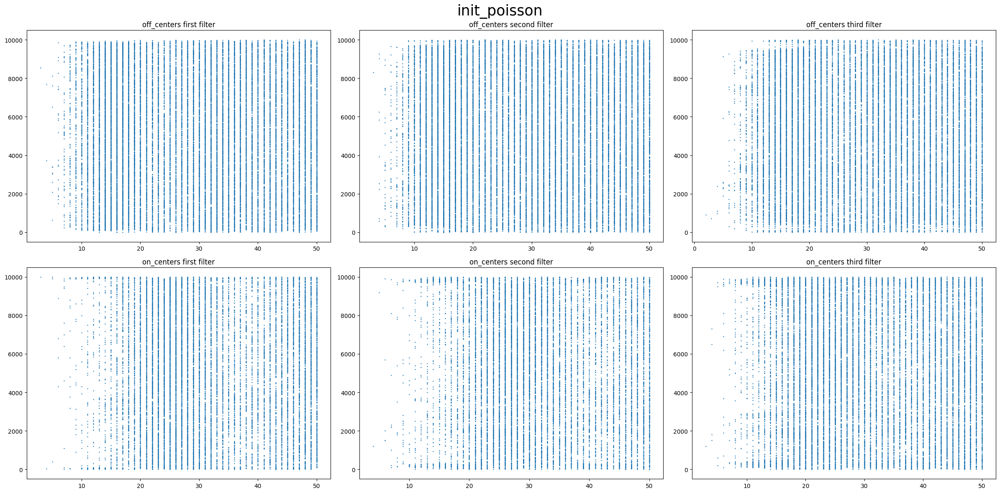

In [162]:
apply_filters(
    image_name="Sample1.jpeg",
    sigma_1=0.66,
    sigma_2=0.2,
    useTorch=True
    )

/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f3 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:25: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f7 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f11 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/Plot_convolution.py:242: UserWarning: The figure layout has

50xBatch: 1/1 (100%) 14.569ms
50xBatch: 1/1 (100%) 8.957ms
50xBatch: 1/1 (100%) 14.098ms
50xBatch: 1/1 (100%) 9.321ms
50xBatch: 1/1 (100%) 8.919ms
50xBatch: 1/1 (100%) 11.508ms


/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/encoding.py:114: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/encoding.py:115: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


50xBatch: 1/1 (100%) 10.724ms
50xBatch: 1/1 (100%) 10.565ms
50xBatch: 1/1 (100%) 9.522ms
50xBatch: 1/1 (100%) 9.554ms
50xBatch: 1/1 (100%) 11.296ms
50xBatch: 1/1 (100%) 10.596ms


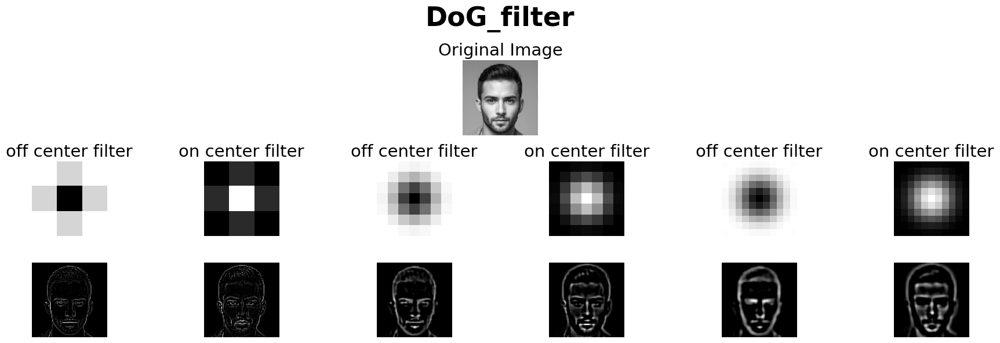

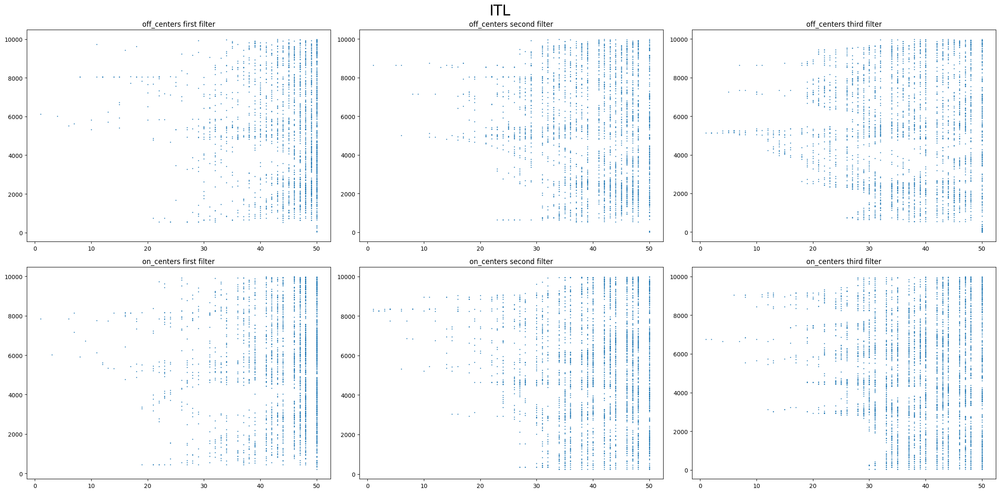

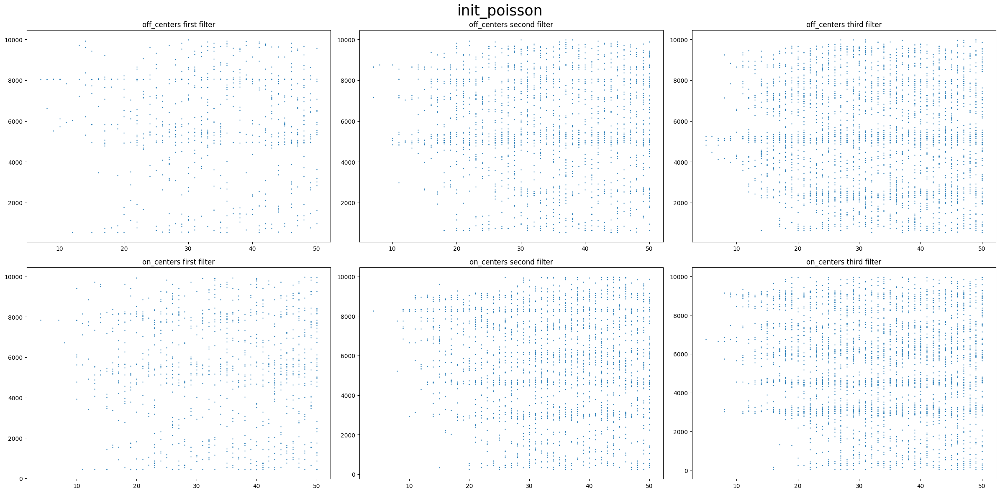

In [172]:
apply_filters(
    image_name="Sample6.jpeg",
    sigma_1=0.66,
    sigma_2=0.2,
    useTorch=False
    )

/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f3 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:25: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f7 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f11 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/Plot_convolution.py:242: UserWarning: The figure layout has

50xBatch: 1/1 (100%) 19.816ms
50xBatch: 1/1 (100%) 15.170ms
50xBatch: 1/1 (100%) 8.961ms
50xBatch: 1/1 (100%) 8.433ms
50xBatch: 1/1 (100%) 8.609ms
50xBatch: 1/1 (100%) 8.597ms


/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/encoding.py:114: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/encoding.py:115: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


50xBatch: 1/1 (100%) 13.371ms
50xBatch: 1/1 (100%) 18.006ms
50xBatch: 1/1 (100%) 13.682ms
50xBatch: 1/1 (100%) 12.691ms
50xBatch: 1/1 (100%) 15.079ms
50xBatch: 1/1 (100%) 14.478ms


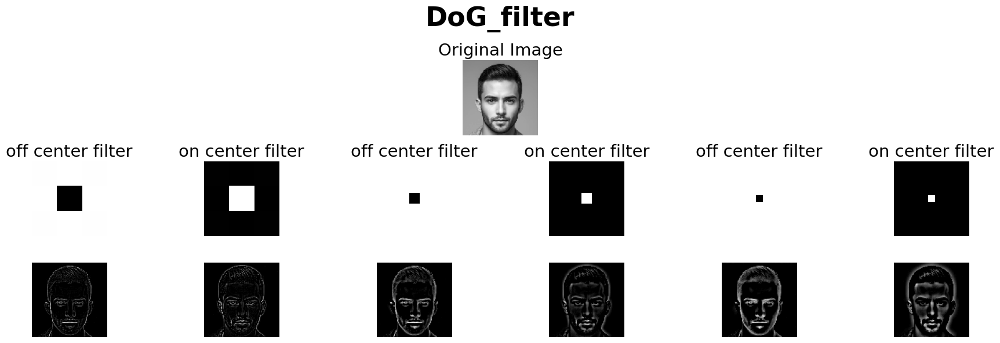

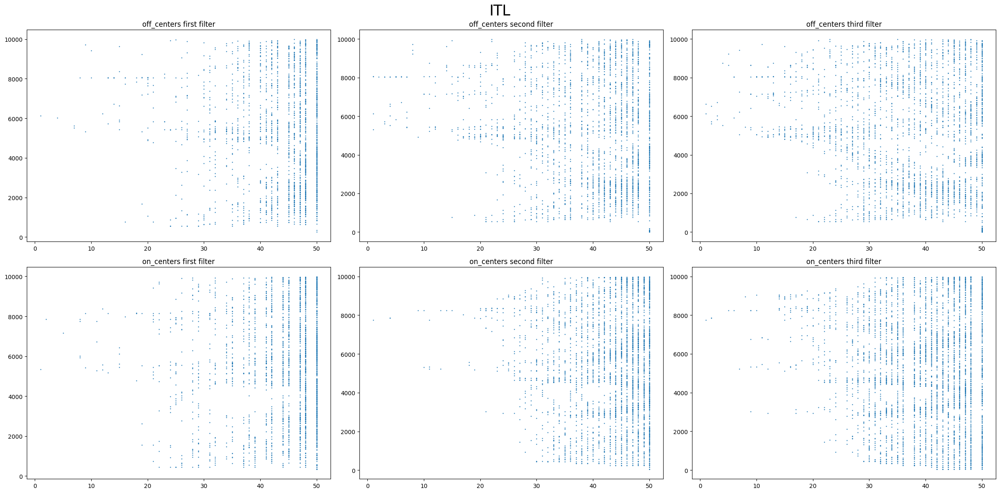

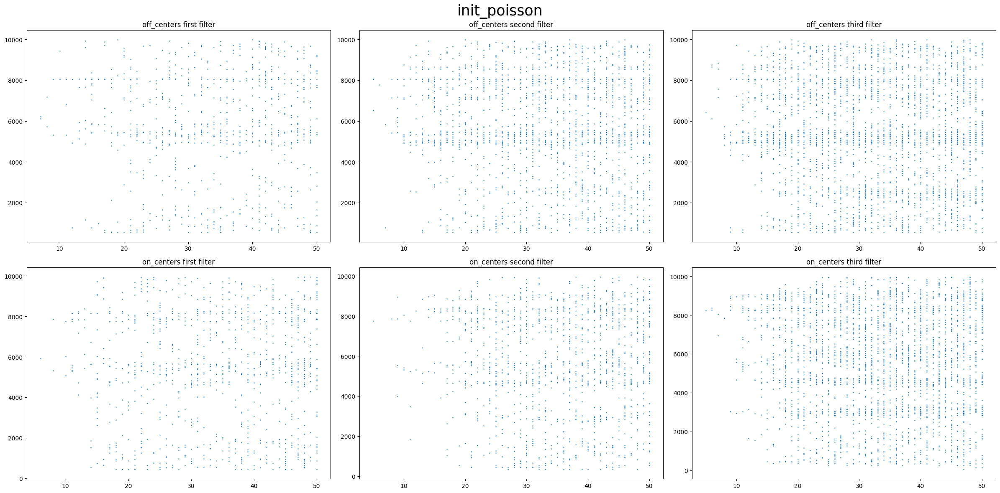

In [170]:
apply_filters(
    image_name="Sample6.jpeg",
    sigma_1=0.99999,
    sigma_2=0.00001,
    useTorch=False 
    )

/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f3 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:25: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f7 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f11 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/convolution.py:474: UserWarning: To copy construct from a t

50xBatch: 1/1 (100%) 11.756ms
50xBatch: 1/1 (100%) 9.666ms
50xBatch: 1/1 (100%) 10.783ms
50xBatch: 1/1 (100%) 9.738ms
50xBatch: 1/1 (100%) 17.136ms
50xBatch: 1/1 (100%) 11.123ms


/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/encoding.py:114: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/encoding.py:115: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


50xBatch: 1/1 (100%) 12.343ms
50xBatch: 1/1 (100%) 11.167ms
50xBatch: 1/1 (100%) 10.149ms
50xBatch: 1/1 (100%) 13.842ms
50xBatch: 1/1 (100%) 13.424ms
50xBatch: 1/1 (100%) 9.630ms


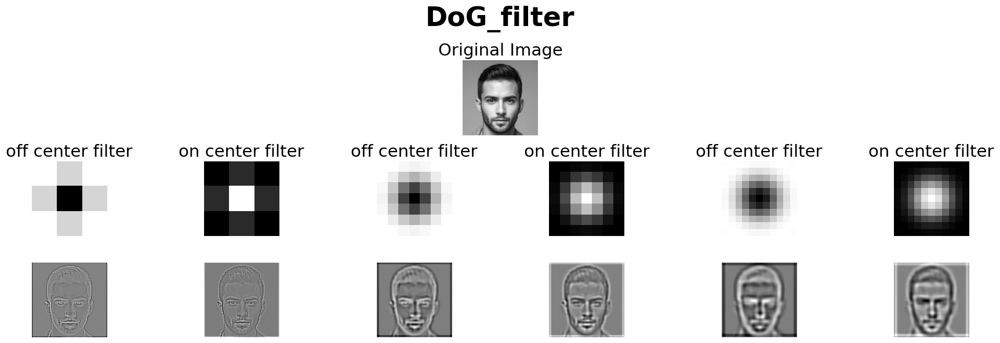

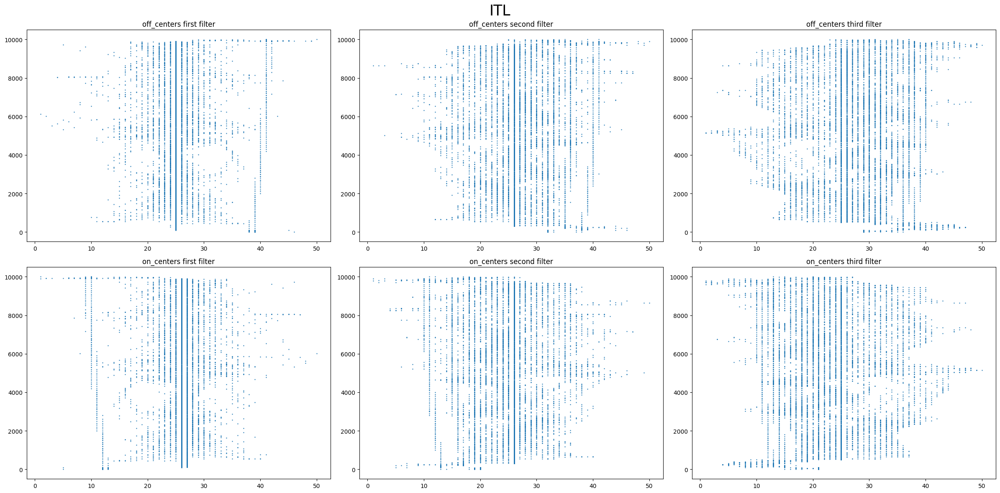

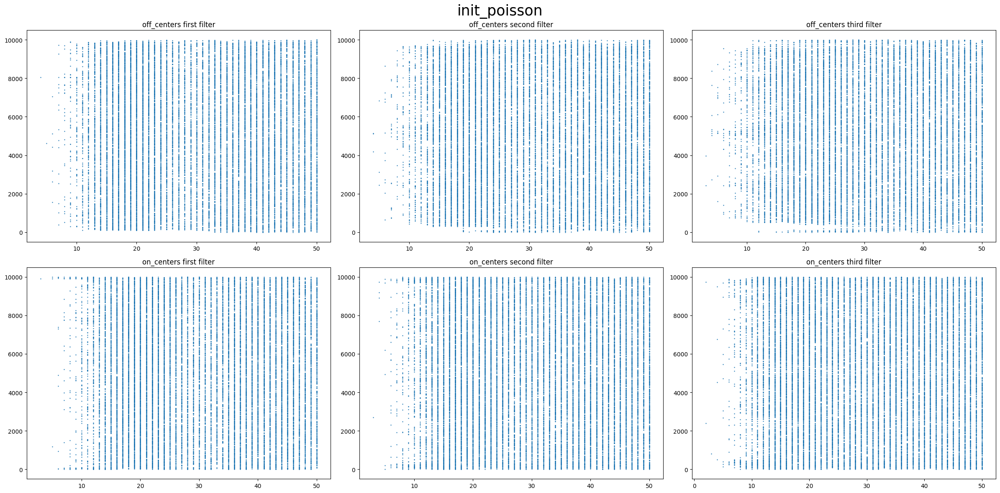

In [173]:
apply_filters(
    image_name="Sample6.jpeg",
    sigma_1=0.66,
    sigma_2=0.2,
    useTorch=True
    )

/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f3 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:25: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f7 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f11 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/convolution.py:474: UserWarning: To copy construct from a t

50xBatch: 1/1 (100%) 23.132ms
50xBatch: 1/1 (100%) 11.306ms
50xBatch: 1/1 (100%) 9.419ms
50xBatch: 1/1 (100%) 15.379ms
50xBatch: 1/1 (100%) 13.256ms
50xBatch: 1/1 (100%) 11.027ms


/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/encoding.py:114: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/encoding.py:115: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


50xBatch: 1/1 (100%) 10.892ms
50xBatch: 1/1 (100%) 11.339ms
50xBatch: 1/1 (100%) 9.959ms
50xBatch: 1/1 (100%) 10.730ms
50xBatch: 1/1 (100%) 15.309ms
50xBatch: 1/1 (100%) 11.647ms


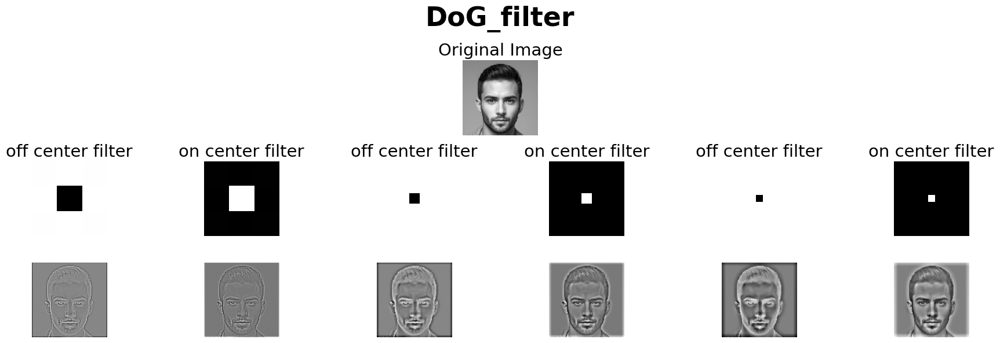

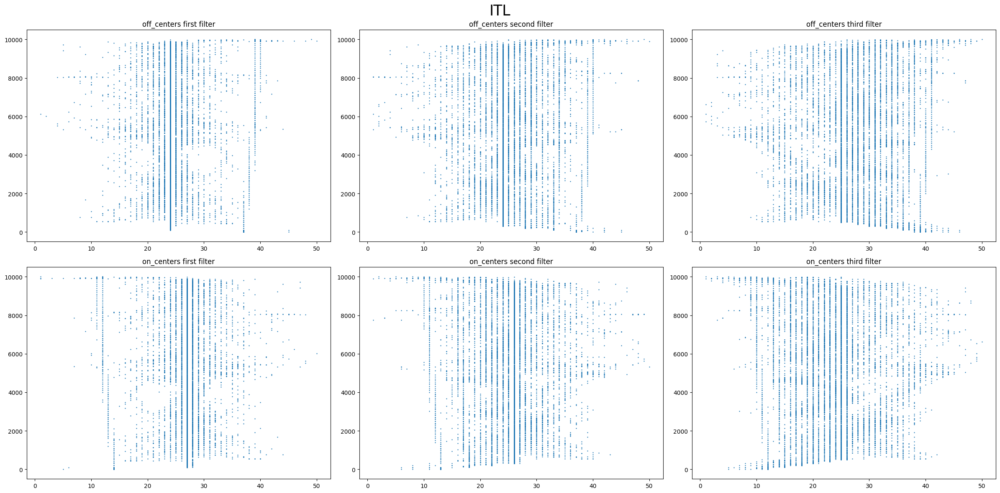

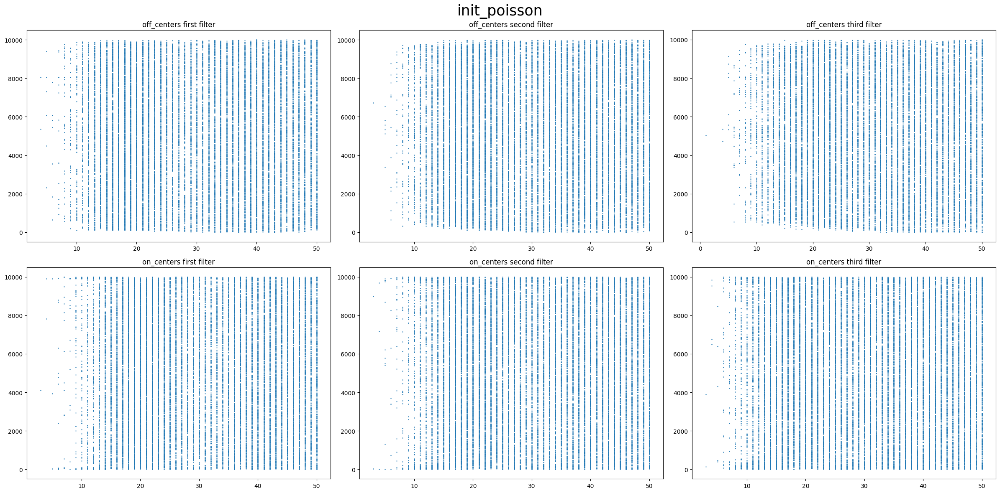

In [169]:
apply_filters(
    image_name="Sample6.jpeg",
    sigma_1=0.99999,
    sigma_2=0.00001,
    useTorch=True
    )

50xBatch: 1/1 (100%) 11.563ms
50xBatch: 1/1 (100%) 13.515ms
50xBatch: 1/1 (100%) 13.680ms
50xBatch: 1/1 (100%) 10.043ms
50xBatch: 1/1 (100%) 12.715ms
50xBatch: 1/1 (100%) 14.560ms
50xBatch: 1/1 (100%) 20.973ms
50xBatch: 1/1 (100%) 15.272ms
50xBatch: 1/1 (100%) 18.131ms
50xBatch: 1/1 (100%) 16.826ms
50xBatch: 1/1 (100%) 24.354ms
50xBatch: 1/1 (100%) 14.689ms


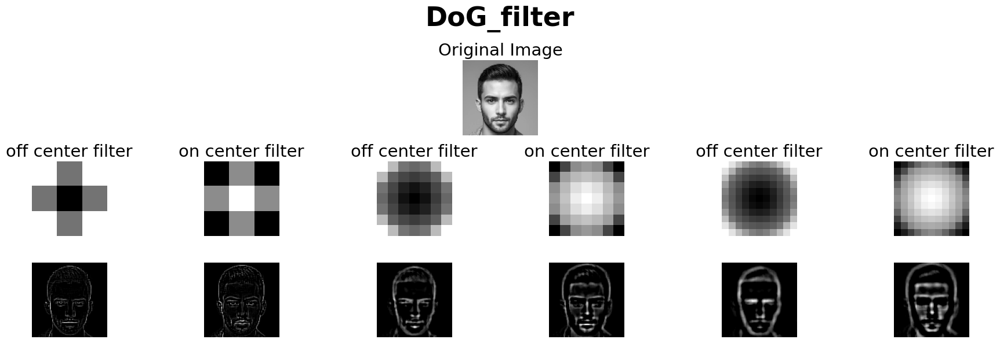

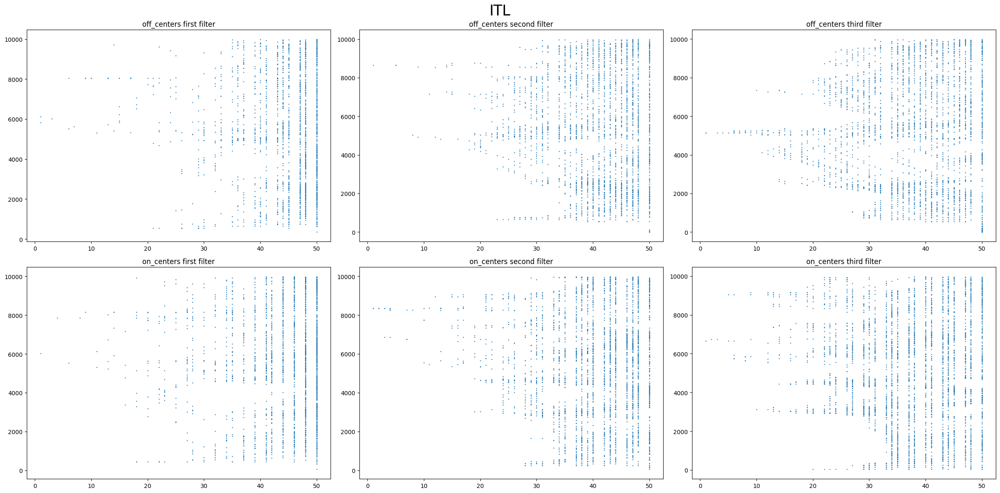

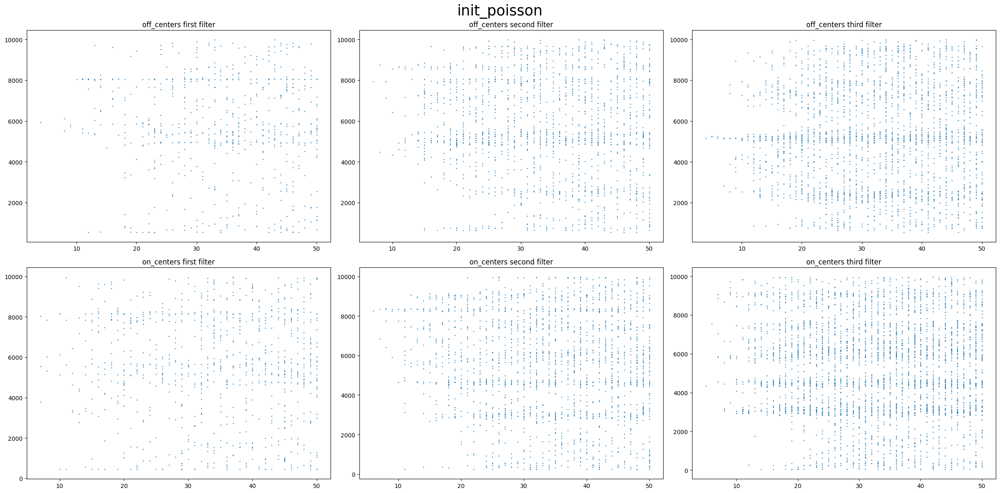

In [175]:
apply_filters(
    image_name="Sample6.jpeg",
    sigma_1=0.76,
    sigma_2=0.3,
    useTorch=False
    )

50xBatch: 1/1 (100%) 44.947ms
50xBatch: 1/1 (100%) 16.050ms
50xBatch: 1/1 (100%) 9.498ms
50xBatch: 1/1 (100%) 9.785ms
50xBatch: 1/1 (100%) 10.876ms
50xBatch: 1/1 (100%) 14.441ms
50xBatch: 1/1 (100%) 23.693ms
50xBatch: 1/1 (100%) 9.218ms
50xBatch: 1/1 (100%) 20.974ms
50xBatch: 1/1 (100%) 29.835ms
50xBatch: 1/1 (100%) 9.737ms
50xBatch: 1/1 (100%) 9.491ms


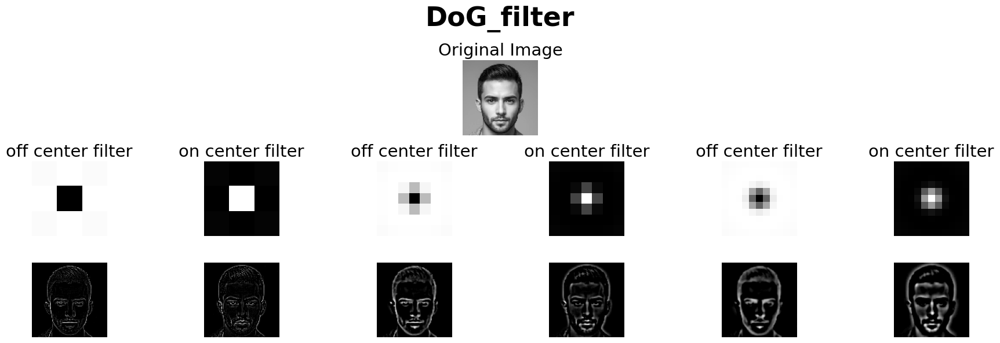

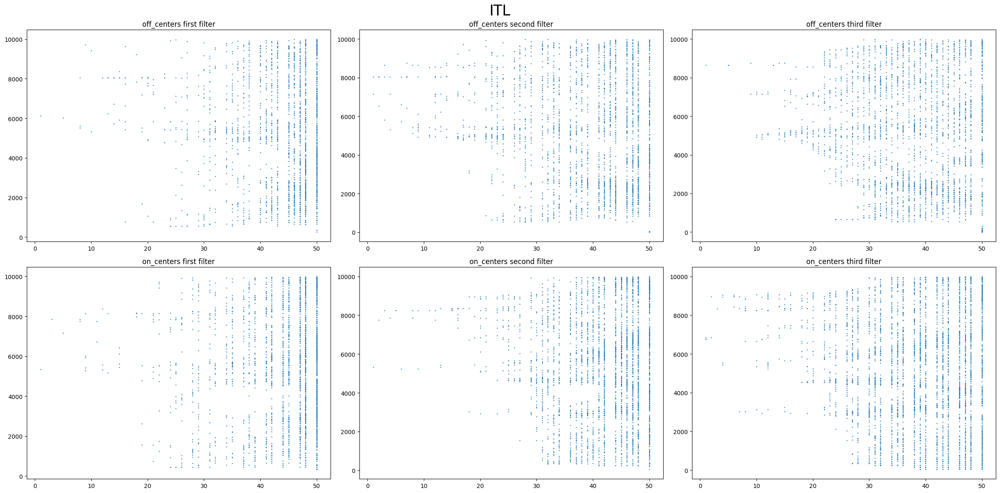

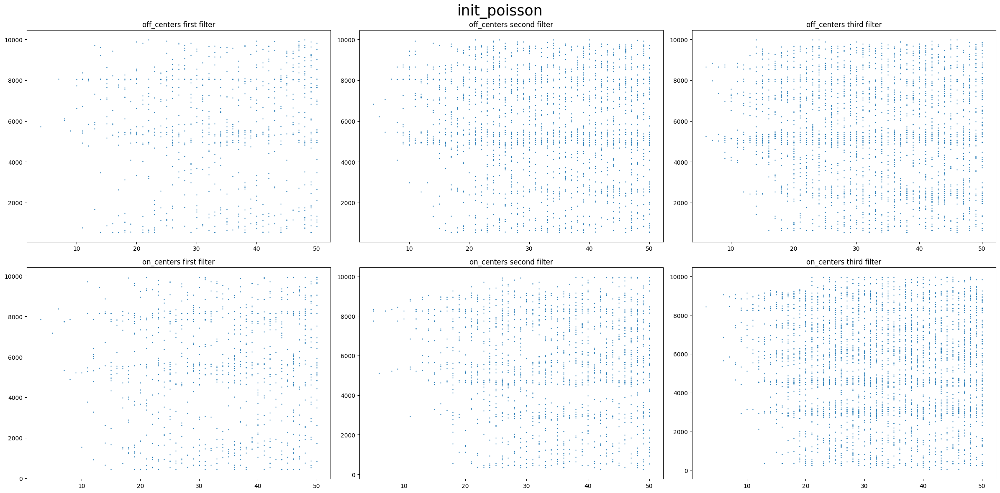

In [176]:
apply_filters(
    image_name="Sample6.jpeg",
    sigma_1=0.56,
    sigma_2=0.1,
    useTorch=False
    )

/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f3 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:25: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f7 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/filters.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f11 = torch.tensor(
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/convolution.py:474: UserWarning: To copy construct from a t

50xBatch: 1/1 (100%) 23.426ms
50xBatch: 1/1 (100%) 15.410ms
50xBatch: 1/1 (100%) 9.395ms
50xBatch: 1/1 (100%) 8.681ms
50xBatch: 1/1 (100%) 13.265ms
50xBatch: 1/1 (100%) 15.580ms


/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/encoding.py:114: UserWarning: The figure layout has changed to tight
  fig.tight_layout()
/Users/delaram/Me/university/term 8/NS/homework/HW5/CodePart/encoding.py:115: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


50xBatch: 1/1 (100%) 10.764ms
50xBatch: 1/1 (100%) 14.010ms
50xBatch: 1/1 (100%) 13.992ms
50xBatch: 1/1 (100%) 9.372ms
50xBatch: 1/1 (100%) 10.870ms
50xBatch: 1/1 (100%) 11.851ms


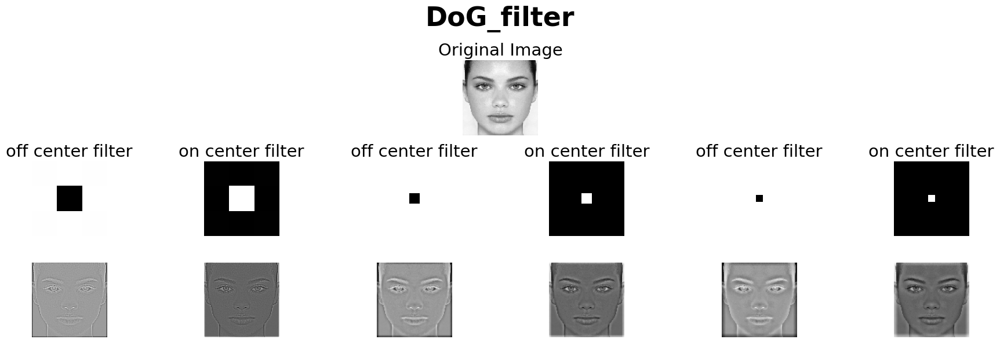

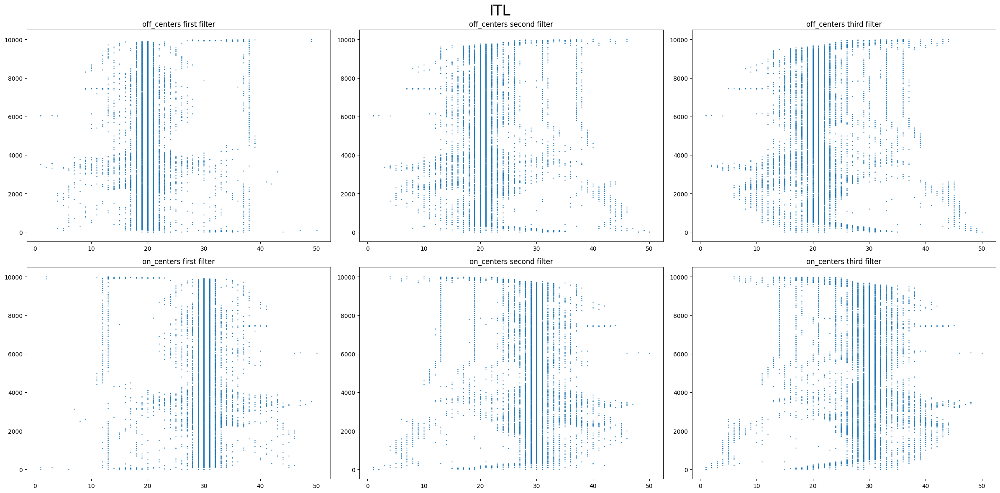

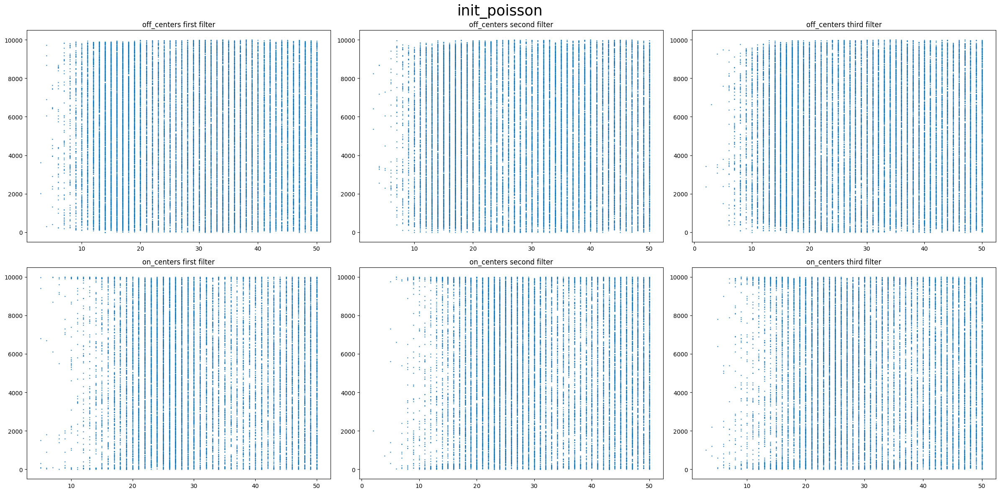

In [163]:
apply_filters(
    image_name="Sample1.jpeg",
    sigma_1=0.9999,
    sigma_2=0.0001,
    useTorch=True
    )

/var/folders/60/rr8w8y8x6399dlnmxj3z_kzr0000gn/T/ipykernel_85054/3956867937.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f3 = torch.tensor(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


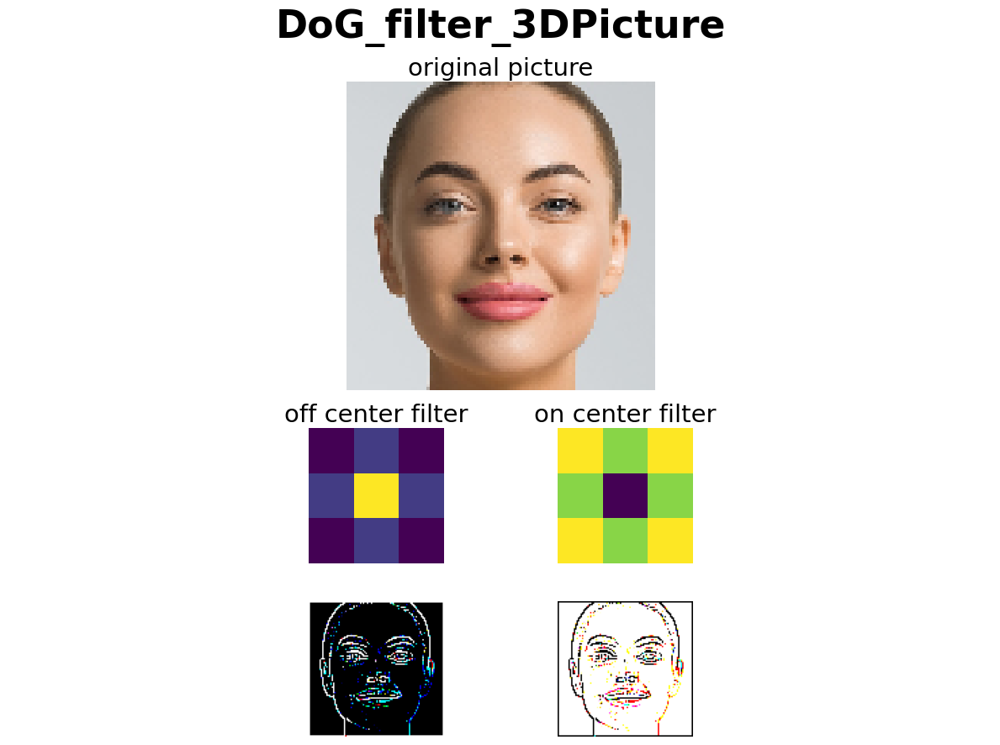

In [131]:
size = 3

f3 = torch.tensor(
    CNX.helpers.filters.DoGFilter(size, size * 3 / 15, size * 10 / 15, one_sum=True),
)

f3 = f3 / (torch.abs(f3)).max()

result = (
    convolve3d(
        "Sample2.jpeg",
        useTorch=True,
        prefix="./pictures/",
        n=100,
        show_image=True,
        filter=f3,
        flatten=True,
        title="DoG_filter_3DPicture"
    ),
)

50xBatch: 1/1 (100%) 14.889ms
50xBatch: 1/1 (100%) 11.337ms
50xBatch: 1/1 (100%) 16.244ms
50xBatch: 1/1 (100%) 9.906ms
50xBatch: 1/1 (100%) 14.253ms
50xBatch: 1/1 (100%) 9.123ms


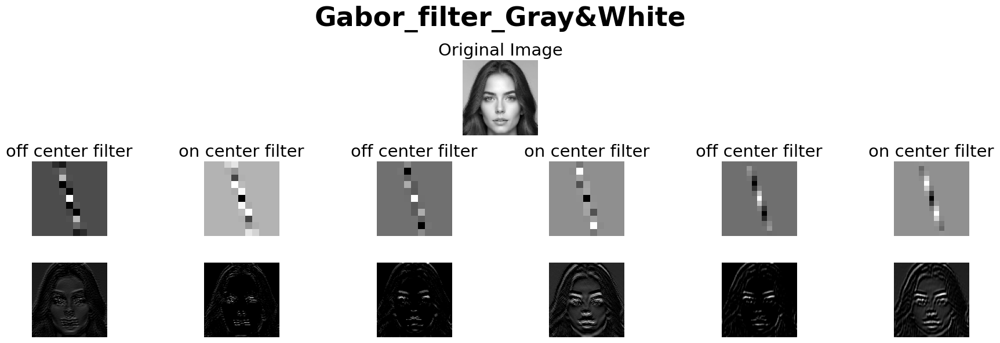

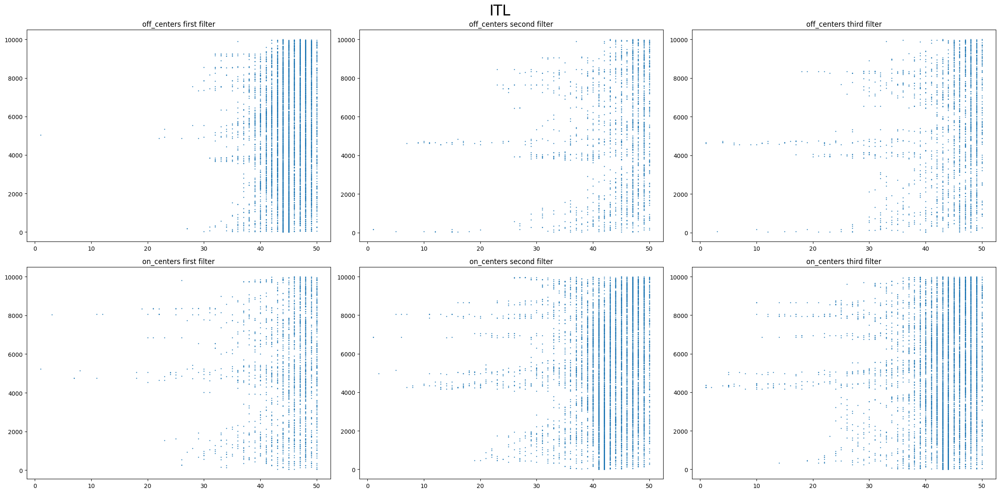

In [101]:
gaborResult = GaborFilter(
labda=0.8, #فرکانس
theta=5,  #زاویه فیلتر
sigma=0.30, #اندازه وسط کرنل
gamma=0.0001, # نستب طول و عرض
)
results = batch_convolve(
    "Sample8.jpeg",
    prefix="./pictures/",
    n=100,
    show_image=True,
    filters=gaborResult,
    flatten=True,
    title="Gabor_filter_Gray&White",
)
encode_and_plot(results, method="ITL")

50xBatch: 1/1 (100%) 15.047ms
50xBatch: 1/1 (100%) 10.630ms
50xBatch: 1/1 (100%) 14.461ms
50xBatch: 1/1 (100%) 14.483ms
50xBatch: 1/1 (100%) 8.905ms
50xBatch: 1/1 (100%) 14.406ms


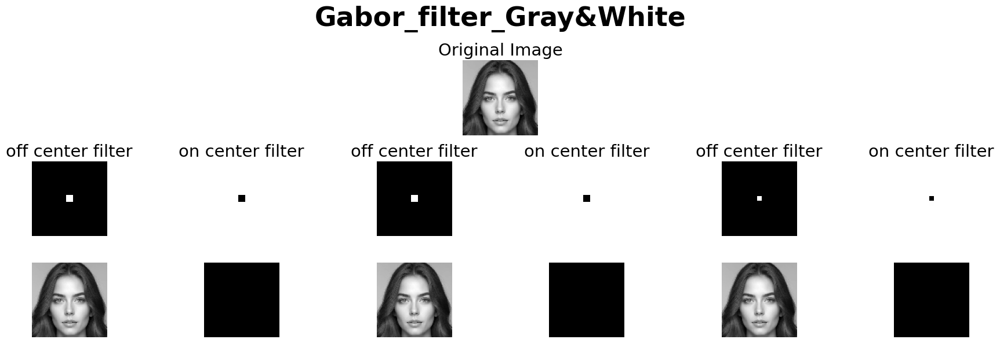

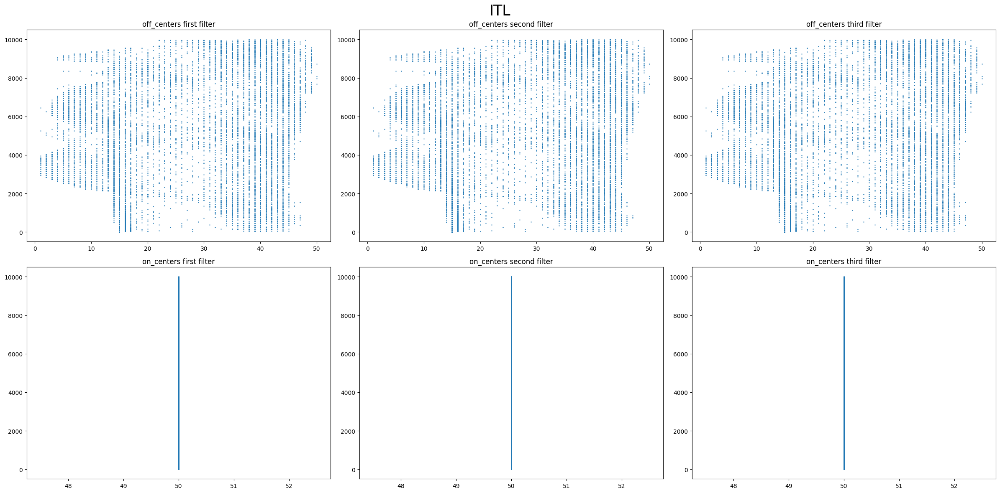

In [142]:
gaborResult = GaborFilter(
labda=0.8, #فرکانس
theta=5,  #زاویه فیلتر
sigma=0.30, #اندازه وسط کرنل
gamma=1, # نستب طول و عرض
)
results = batch_convolve(
    "Sample8.jpeg",
    prefix="./pictures/",
    n=100,
    show_image=True,
    filters=gaborResult,
    flatten=True,
    title="Gabor_filter_Gray&White",
)
encode_and_plot(results, method="ITL")

50xBatch: 1/1 (100%) 13.728ms
50xBatch: 1/1 (100%) 11.110ms
50xBatch: 1/1 (100%) 12.165ms
50xBatch: 1/1 (100%) 7.580ms
50xBatch: 1/1 (100%) 12.028ms
50xBatch: 1/1 (100%) 8.495ms


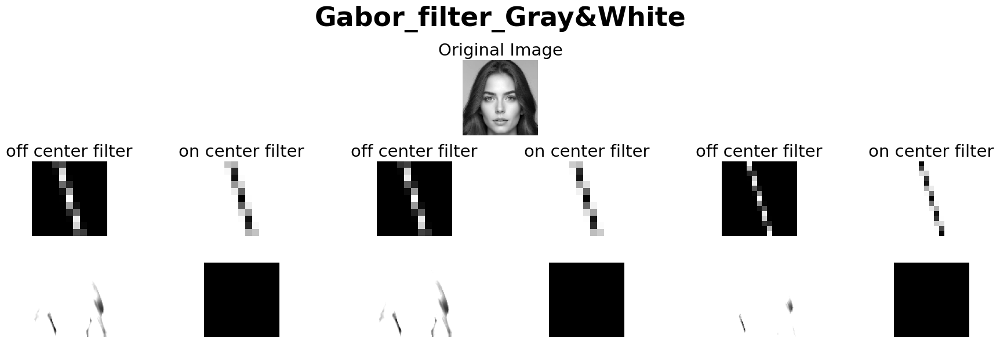

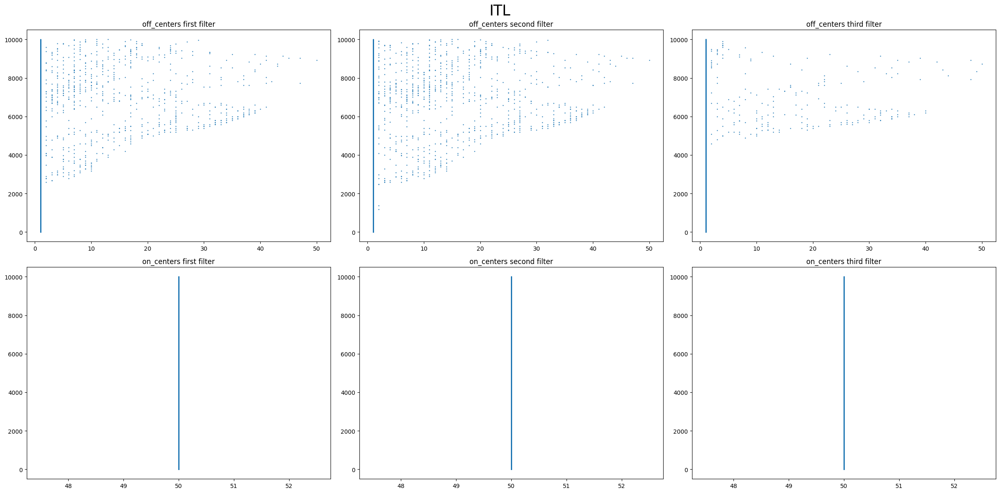

In [159]:
gaborResult = GaborFilter(
labda=10, #فرکانس
theta=5,  #زاویه فیلتر
sigma=0.30, #اندازه وسط کرنل
gamma=0.001, # نستب طول و عرض
)
results = batch_convolve(
    "Sample8.jpeg",
    prefix="./pictures/",
    n=100,
    show_image=True,
    filters=gaborResult,
    flatten=True,
    title="Gabor_filter_Gray&White",
)
encode_and_plot(results, method="ITL")

50xBatch: 1/1 (100%) 13.820ms
50xBatch: 1/1 (100%) 12.625ms
50xBatch: 1/1 (100%) 9.029ms
50xBatch: 1/1 (100%) 10.826ms
50xBatch: 1/1 (100%) 9.703ms
50xBatch: 1/1 (100%) 13.972ms


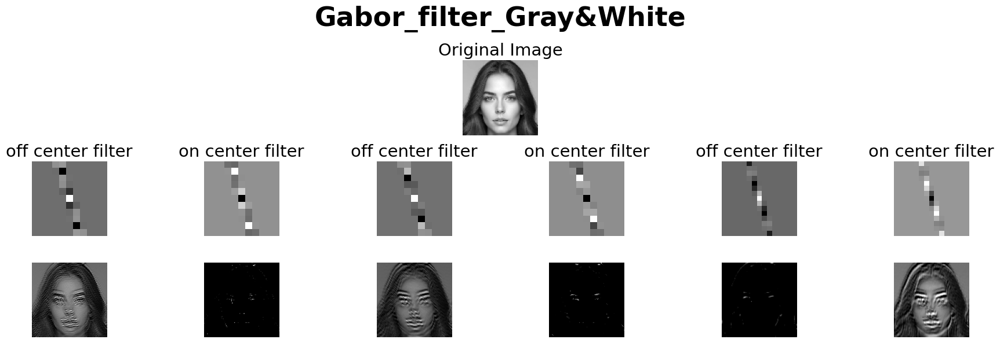

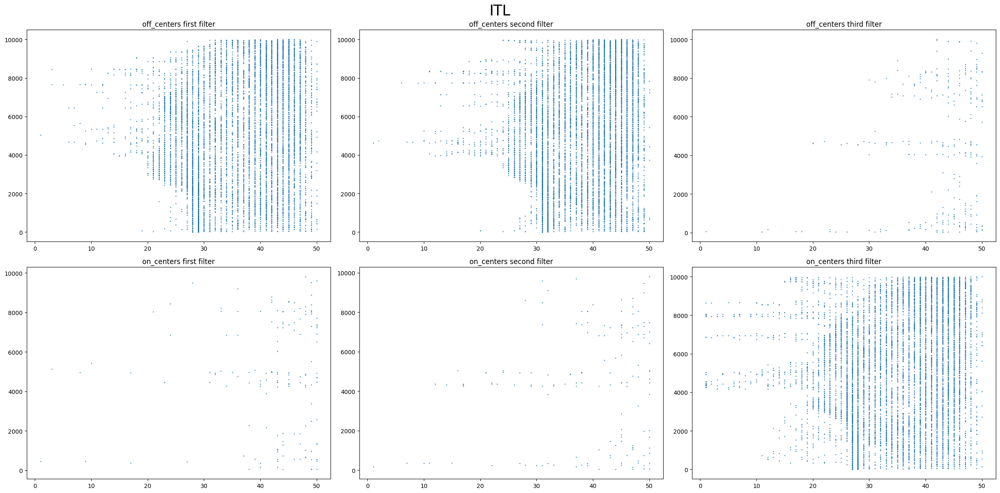

In [161]:
gaborResult = GaborFilter(
labda=0.01, #فرکانس
theta=5,  #زاویه فیلتر
sigma=0.30, #اندازه وسط کرنل
gamma=0.001, # نستب طول و عرض
)
results = batch_convolve(
    "Sample8.jpeg",
    prefix="./pictures/",
    n=100,
    show_image=True,
    filters=gaborResult,
    flatten=True,
    title="Gabor_filter_Gray&White",
)
encode_and_plot(results, method="ITL")

50xBatch: 1/1 (100%) 16.672ms
50xBatch: 1/1 (100%) 12.294ms
50xBatch: 1/1 (100%) 14.082ms
50xBatch: 1/1 (100%) 11.713ms
50xBatch: 1/1 (100%) 9.561ms
50xBatch: 1/1 (100%) 16.379ms


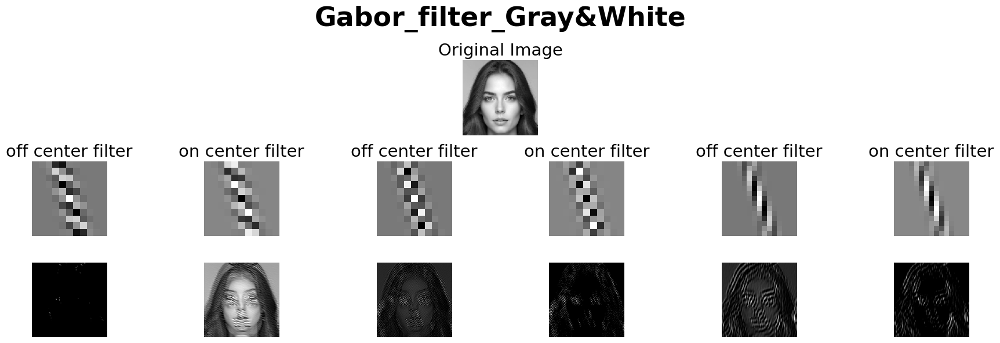

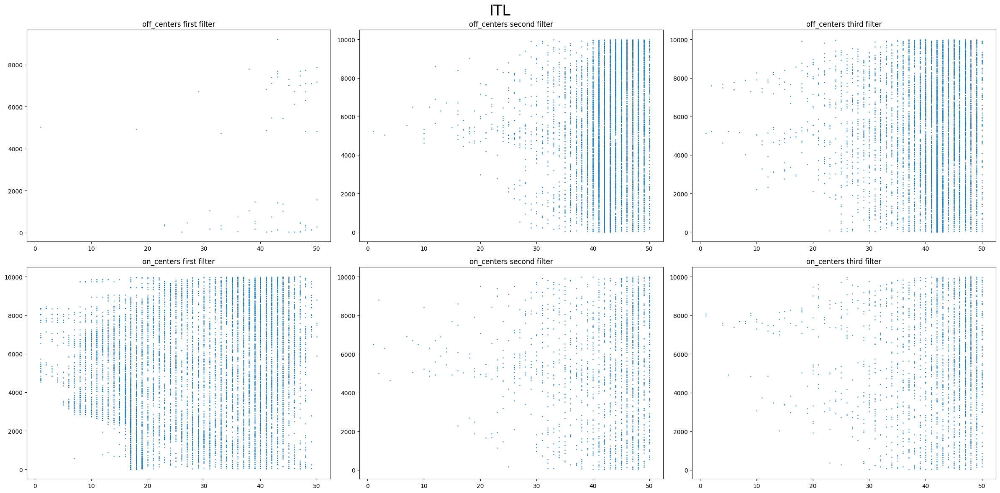

In [112]:
gaborResult = GaborFilter(
labda=0.8, #فرکانس
theta=5,  #زاویه فیلتر
sigma=0.9, #اندازه وسط کرنل
gamma=0.0001, # نستب طول و عرض
)
results = batch_convolve(
    "Sample8.jpeg",
    prefix="./pictures/",
    n=100,
    show_image=True,
    filters=gaborResult,
    flatten=True,
    title="Gabor_filter_Gray&White",
)
encode_and_plot(results, method="ITL")

50xBatch: 1/1 (100%) 12.168ms
50xBatch: 1/1 (100%) 13.175ms
50xBatch: 1/1 (100%) 10.102ms
50xBatch: 1/1 (100%) 12.497ms
50xBatch: 1/1 (100%) 11.698ms
50xBatch: 1/1 (100%) 11.749ms


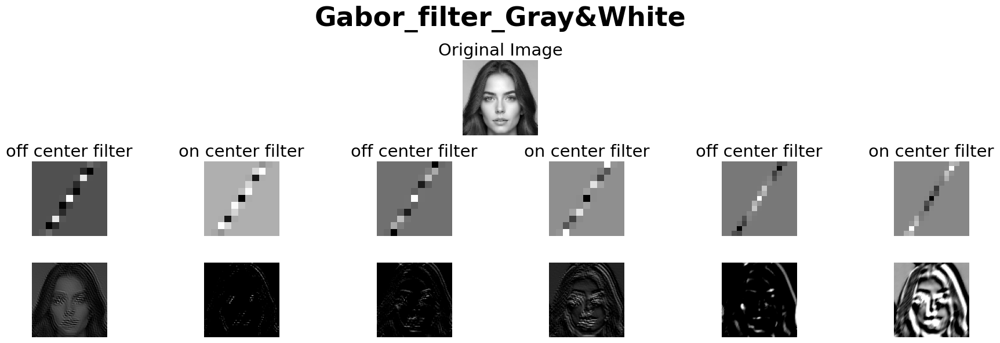

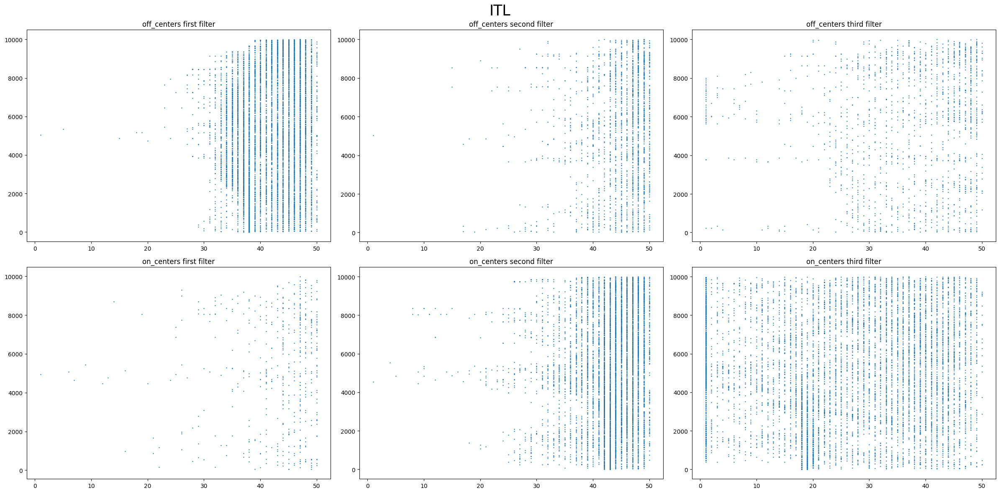

In [107]:
gaborResult = GaborFilter(
labda=0.8, #فرکانس
theta=1,  #زاویه فیلتر
sigma=0.30, #اندازه وسط کرنل
gamma=0.0001, # نستب طول و عرض
)
results = batch_convolve(
    "Sample8.jpeg",
    prefix="./pictures/",
    n=100,
    show_image=True,
    filters=gaborResult,
    flatten=True,
    title="Gabor_filter_Gray&White",
)
encode_and_plot(results, method="ITL")

50xBatch: 1/1 (100%) 18.970ms
50xBatch: 1/1 (100%) 11.070ms
50xBatch: 1/1 (100%) 9.225ms
50xBatch: 1/1 (100%) 9.959ms
50xBatch: 1/1 (100%) 15.432ms
50xBatch: 1/1 (100%) 14.057ms
50xBatch: 1/1 (100%) 14.959ms
50xBatch: 1/1 (100%) 14.069ms
50xBatch: 1/1 (100%) 10.518ms
50xBatch: 1/1 (100%) 20.352ms
50xBatch: 1/1 (100%) 10.036ms
50xBatch: 1/1 (100%) 11.439ms


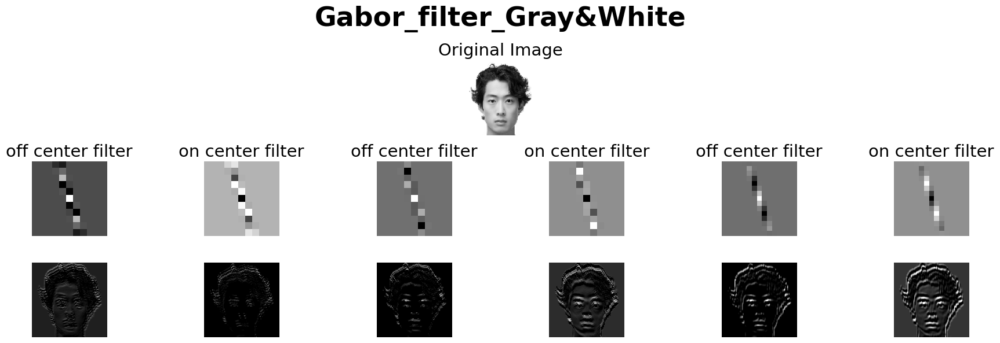

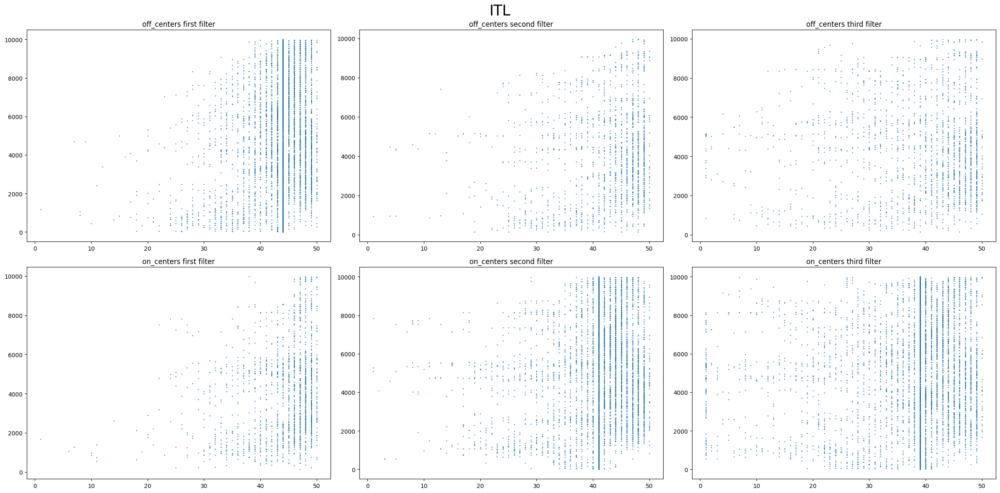

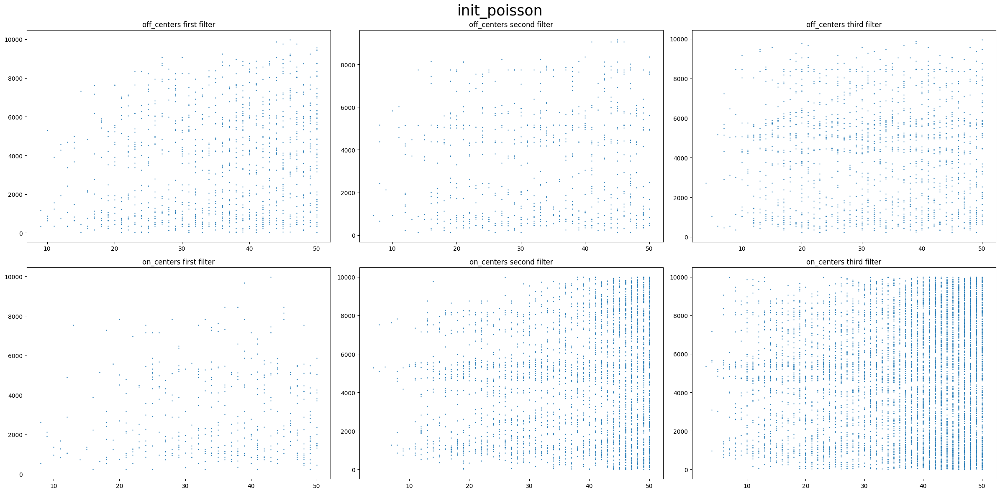

In [126]:
gaborResult = GaborFilter(
labda=0.8, #فرکانس
theta=5,  #زاویه فیلتر
sigma=0.30, #اندازه وسط کرنل
gamma=0.0001, # نستب طول و عرض
)
results = batch_convolve(
    "Sample3.jpeg",
    prefix="./pictures/",
    n=100,
    show_image=True,
    filters=gaborResult,
    flatten=True,
    title="Gabor_filter_Gray&White",
)
encode_and_plot(results, method="ITL")
encode_and_plot(results, method="init_poisson")